In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

import sys
import shutil
import os
from pathlib import Path
import numpy as np
import pandas as pd

In [2]:
from fastai import *
from fastai.vision import *

In [3]:
torch.__version__

'1.0.0.dev20181028'

In [4]:
path = Path("../DATA/airbus-ship/")
files = list(path.iterdir())

In [5]:
files

[PosixPath('../DATA/airbus-ship/clean_has_ship_test.txt'),
 PosixPath('../DATA/airbus-ship/train'),
 PosixPath('../DATA/airbus-ship/train_ship_segmentations.csv'),
 PosixPath('../DATA/airbus-ship/segmentation'),
 PosixPath('../DATA/airbus-ship/submission'),
 PosixPath('../DATA/airbus-ship/team_data'),
 PosixPath('../DATA/airbus-ship/test_v2'),
 PosixPath('../DATA/airbus-ship/tmp'),
 PosixPath('../DATA/airbus-ship/detection'),
 PosixPath('../DATA/airbus-ship/test_ship_segmentations.csv'),
 PosixPath('../DATA/airbus-ship/test_detection'),
 PosixPath('../DATA/airbus-ship/models'),
 PosixPath('../DATA/airbus-ship/classification'),
 PosixPath('../DATA/airbus-ship/clean_delete_train.txt'),
 PosixPath('../DATA/airbus-ship/clean_has_ship_train.txt'),
 PosixPath('../DATA/airbus-ship/test')]

### Prepare data

In [6]:
fold_csvs = list((path/"team_data/folds").iterdir()); fold_csvs

[PosixPath('../DATA/airbus-ship/team_data/folds/classifierC_hasships_3_val_index.csv'),
 PosixPath('../DATA/airbus-ship/team_data/folds/classifierC_hasships_1_val_index.csv'),
 PosixPath('../DATA/airbus-ship/team_data/folds/classifierC_hasships_5_val_index.csv'),
 PosixPath('../DATA/airbus-ship/team_data/folds/classifierC_hasships_4_val_index.csv'),
 PosixPath('../DATA/airbus-ship/team_data/folds/classifierC_hasships_2_val_index.csv')]

In [7]:
MASKS_FN = path/"team_data/ships_train_tiles_all.csv"
TRAIN_DN = path/"team_data/mosaic_tiles"
MASKS_DN = path/"team_data/mosaic_tiles_masks"

def split_by_idx(idxs, *a):
    mask = np.zeros(len(a[0]),dtype=bool)
    mask[np.array(idxs)] = True
    return [(o[mask],o[~mask]) for o in a]
    
masks_csv = pd.read_csv(MASKS_FN)

In [8]:
masks_csv_small_med = masks_csv[masks_csv.area.isin(['med', 'low'])]
masks_csv_small_med = masks_csv_small_med['fn'].values

In [9]:
x_fns = np.array([Path(TRAIN_DN)/f'{o}' for o in masks_csv['fn']]) #[o for o in path.iterdir() if o.is_file()]
y_fns = np.array([Path(MASKS_DN)/f'{o}' for o in masks_csv['fn']]) #[get_y_fn(o) for o in x_fns]
val_idxs = np.loadtxt(fold_csvs[0], dtype=int)
((val_x,trn_x),(val_y,trn_y)) = split_by_idx(val_idxs, x_fns, y_fns)

In [10]:
len(trn_x), len(val_x)

(39112, 9800)

In [11]:
val_x_sml = [o for o in val_x if o.name in masks_csv_small_med]
val_y_sml = [o for o in val_y if o.name in masks_csv_small_med]

In [12]:
trn_x_sml = [o for o in trn_x if o.name in masks_csv_small_med]
trn_y_sml = [o for o in trn_y if o.name in masks_csv_small_med]

In [73]:
len(trn_x_sml), len(val_x_sml)

(25814, 6762)

In [13]:
TRN_X = trn_x_sml
TRN_Y = trn_y_sml

VAL_X = val_x_sml
VAL_Y = val_y_sml

TEST_X = None
TEST_Y = None

In [81]:
np.save("TRN_X_SML", np.array(TRN_X))
np.save("TRN_Y_SML", np.array(TRN_Y))
np.save("VAL_X_SML", np.array(VAL_X))
np.save("VAL_Y_SML", np.array(VAL_Y))

### Data

In [6]:
TRN_X = np.load("TRN_X_SML.npy")
TRN_Y = np.load("TRN_Y_SML.npy")
VAL_X = np.load("VAL_X_SML.npy")
VAL_Y = np.load("VAL_Y_SML.npy")

In [7]:
class DatasetBase(Dataset):
    "Base class for all fastai datasets."
    def __init__(self, c:int): self.c,self.item = c,None
    def __len__(self): return len(getattr(self, 'x', [1]))
    def set_item(self,item): self.item = item
    def clear_item(self): self.item = None
    def __repr__(self): return f'{type(self).__name__} of len {len(self)}'

    @abstractmethod
    def _get_x(self,i): pass
    @abstractmethod
    def _get_y(self,i): pass

    def __getitem__(self, i):
        if self.item is None: return self._get_x(i),self._get_y(i)
        else: return self.item,0

In [8]:
class ImageSegment(Image):
    "Support applying transforms to segmentation masks data in `px`."
    def lighting(self, func:LightingFunc, *args:Any, **kwargs:Any)->'Image': return self

    def refresh(self):
        self.sample_kwargs['mode'] = 'bilinear'
        return super().refresh()

    @property
    def data(self)->TensorImage:
        "Return this image pixels as a `LongTensor`."
        return self.px.long()

    def show(self, ax:plt.Axes=None, figsize:tuple=(3,3), title:Optional[str]=None, hide_axis:bool=True,
        cmap:str='tab20', alpha:float=0.5, **kwargs):
        ax = show_image(self, ax=ax, hide_axis=hide_axis, cmap=cmap, figsize=figsize, alpha=alpha)
        if title: ax.set_title(title)

In [9]:
class SegmentationDataset(DatasetBase):
    "A dataset for segmentation task."
    def __init__(self, path:PathOrStr, x:FilePathList, y:FilePathList, classes:Collection[Any]):
        assert len(x)==len(y)
        super().__init__(c=None)
        self.x, self.y = np.array(x),np.array(y)
        self.classes = classes
        self.path = path
    
    def _get_x(self, i):
        return open_image(self.x[i])
        
    def _get_y(self, i):    
        return open_mask(self.y[i], div=True)

In [10]:
class ImageDataBunch(DataBunch):
    @classmethod
    def create(cls, train_ds, valid_ds, test_ds=None, path:PathOrStr='.', bs:int=64, ds_tfms:Optional[TfmList]=None,
                     num_workers:int=defaults.cpus, tfms:Optional[Collection[Callable]]=None, device:torch.device=None,
                     collate_fn:Callable=data_collate, size:int=None, **kwargs)->'ImageDataBunch':
        "Factory method. `bs` batch size, `ds_tfms` for `Dataset`, `tfms` for `DataLoader`."
        datasets = [train_ds,valid_ds]
        if test_ds is not None: datasets.append(test_ds)
        if ds_tfms: datasets = transform_datasets(*datasets, tfms=ds_tfms, size=size, **kwargs)
        dls = [DataLoader(*o, num_workers=num_workers) for o in
               zip(datasets, (bs,bs,bs), (True,False,False))]
        return cls(*dls, path=path, device=device, tfms=tfms, collate_fn=collate_fn)


In [43]:
trn_ds = SegmentationDataset(path, x=TRN_X, y=TRN_Y, classes=['ship'])
val_ds = SegmentationDataset(path, x=VAL_X, y=VAL_Y , classes=['ship'])

In [44]:
768//4

192

In [45]:
data = ImageDataBunch.create(train_ds=trn_ds,
                             valid_ds=val_ds,
                             test_ds=None,
                             path=path,
                             bs=64, num_workers=8, size=192,
                             do_crop=True,
                             ds_tfms=get_transforms(), tfm_y=True,
                             stats=imagenet_stats)

In [46]:
get_transforms()

([RandTransform(tfm=TfmCrop (crop_pad), kwargs={'row_pct': (0, 1), 'col_pct': (0, 1)}, p=1.0, resolved={}, do_run=True, is_random=True),
  RandTransform(tfm=TfmAffine (flip_affine), kwargs={}, p=0.5, resolved={}, do_run=True, is_random=True),
  RandTransform(tfm=TfmCoord (symmetric_warp), kwargs={'magnitude': (-0.2, 0.2)}, p=0.75, resolved={}, do_run=True, is_random=True),
  RandTransform(tfm=TfmAffine (rotate), kwargs={'degrees': (-10.0, 10.0)}, p=0.75, resolved={}, do_run=True, is_random=True),
  RandTransform(tfm=TfmAffine (zoom), kwargs={'row_pct': (0, 1), 'col_pct': (0, 1), 'scale': (1.0, 1.1)}, p=0.75, resolved={}, do_run=True, is_random=True),
  RandTransform(tfm=TfmLighting (brightness), kwargs={'change': (0.4, 0.6)}, p=0.75, resolved={}, do_run=True, is_random=True),
  RandTransform(tfm=TfmLighting (contrast), kwargs={'scale': (0.8, 1.25)}, p=0.75, resolved={}, do_run=True, is_random=True)],
 [RandTransform(tfm=TfmCrop (crop_pad), kwargs={}, p=1.0, resolved={}, do_run=True, is

In [47]:
x,y = next(iter(data.valid_dl))

KeyboardInterrupt: 

In [25]:
x.shape, y.shape

(torch.Size([64, 3, 192, 192]), torch.Size([64, 1, 192, 192]))

In [67]:
x_np, y_np = to_np(x), to_np(y.squeeze(1))

In [69]:
x_np.shape, y_np.shape

((64, 3, 192, 192), (64, 192, 192))

161 [0 1]


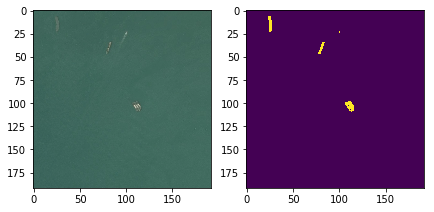

130 [0 1]


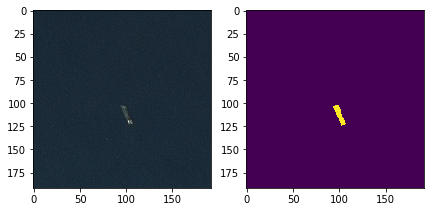

161 [0 1]


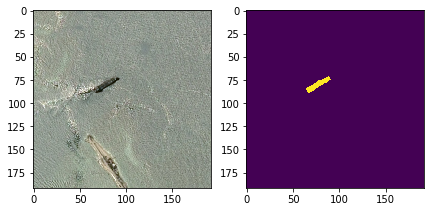

14 [0 1]


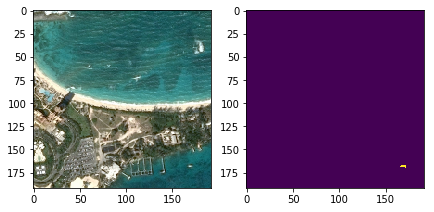

103 [0 1]


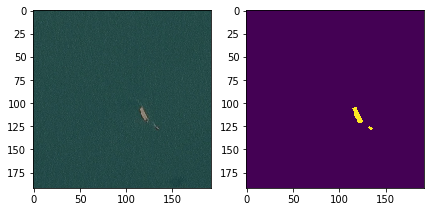

22 [0 1]


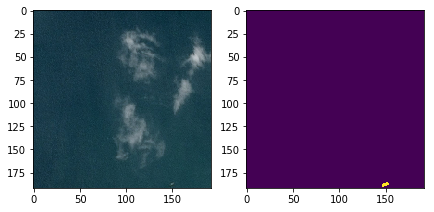

7 [0 1]


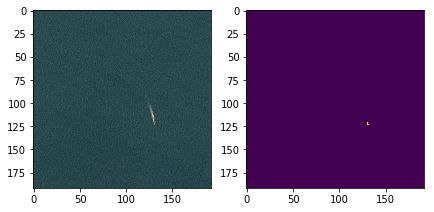

13 [0 1]


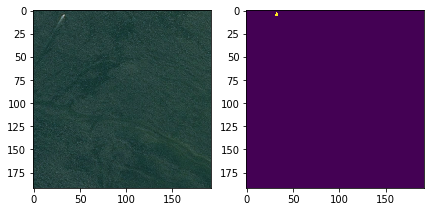

8 [0 1]


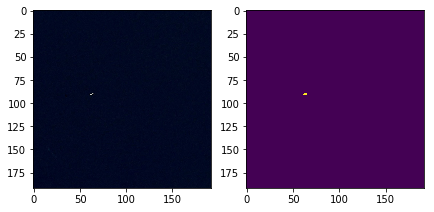

9 [0 1]


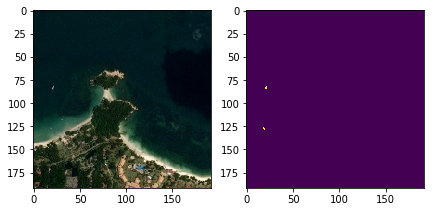

104 [0 1]


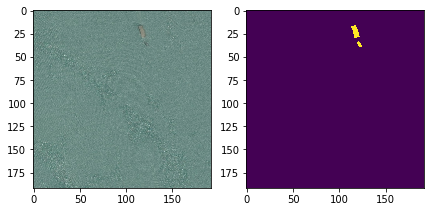

107 [0 1]


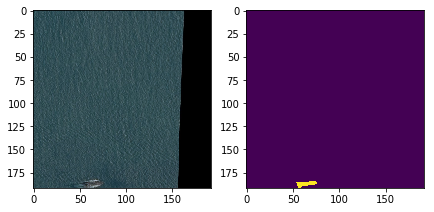

116 [0 1]


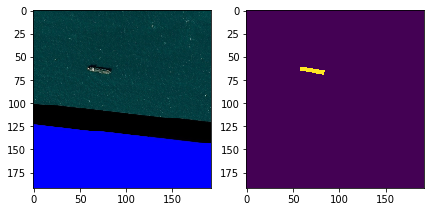

4 [0 1]


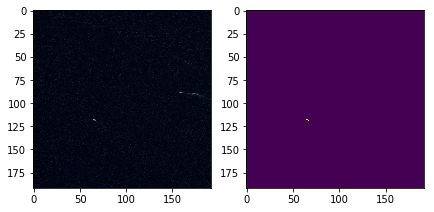

101 [0 1]


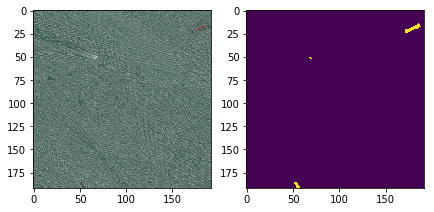

60 [0 1]


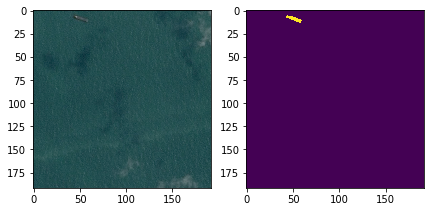

111 [0 1]


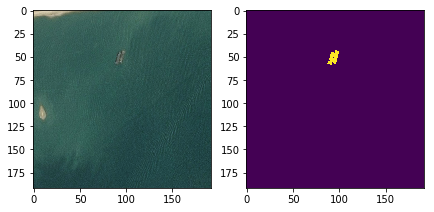

11 [0 1]


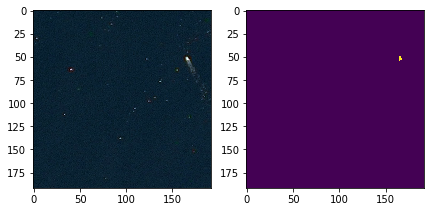

4 [0 1]


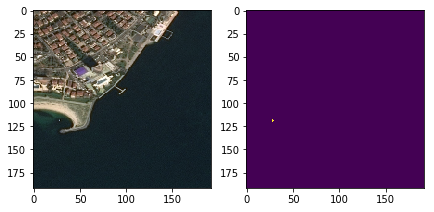

7 [0 1]


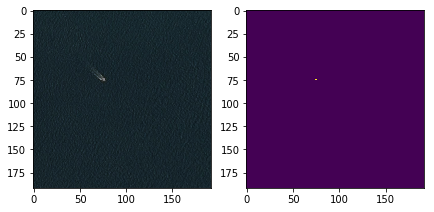

13 [0 1]


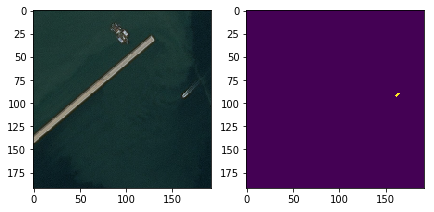

77 [0 1]


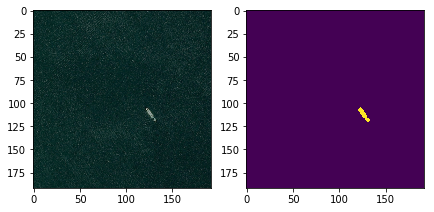

38 [0 1]


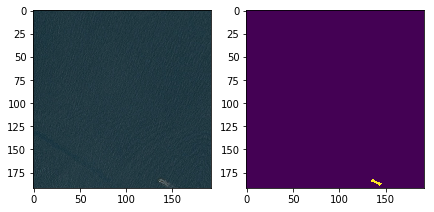

14 [0 1]


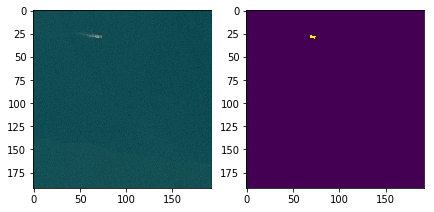

51 [0 1]


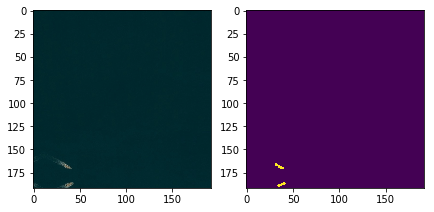

14 [0 1]


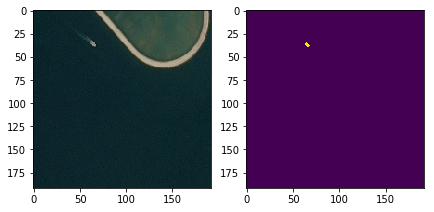

24 [0 1]


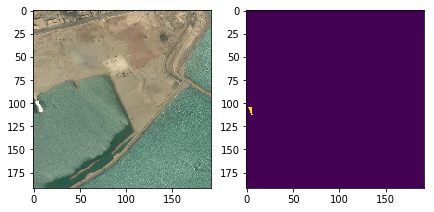

93 [0 1]


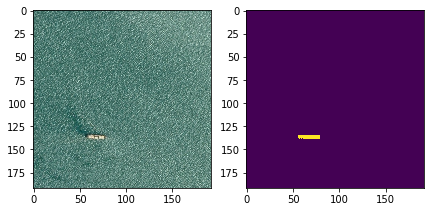

74 [0 1]


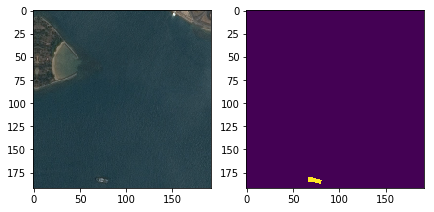

25 [0 1]


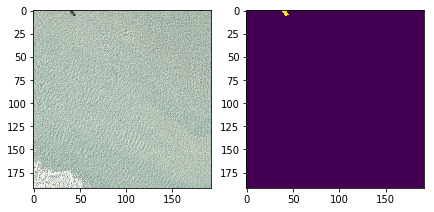

11 [0 1]


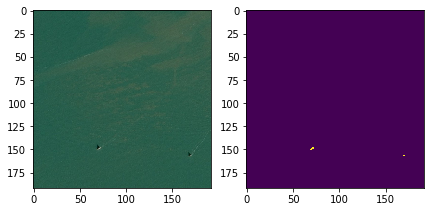

10 [0 1]


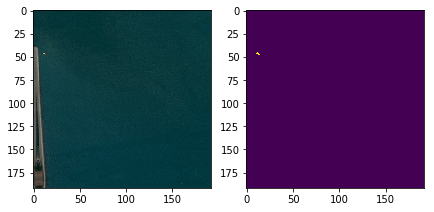

11 [0 1]


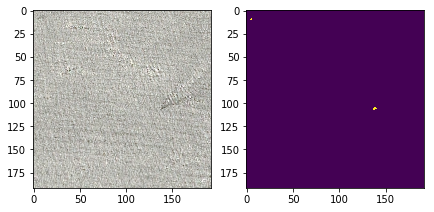

16 [0 1]


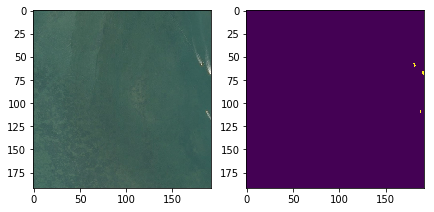

9 [0 1]


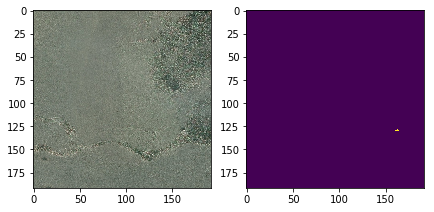

11 [0 1]


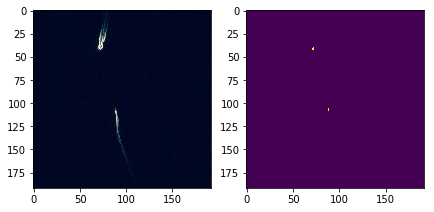

25 [0 1]


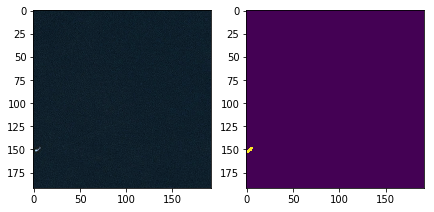

19 [0 1]


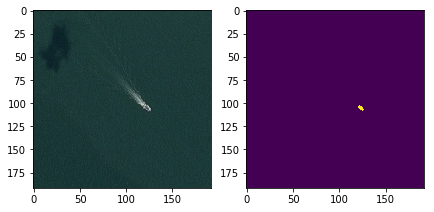

138 [0 1]


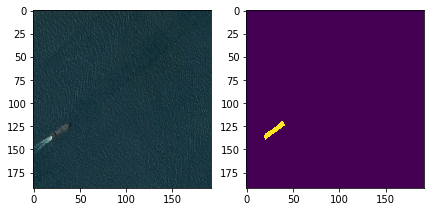

32 [0 1]


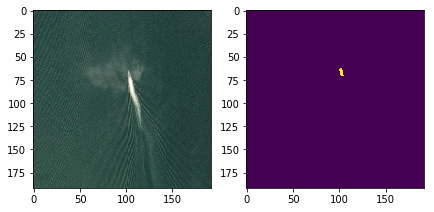

17 [0 1]


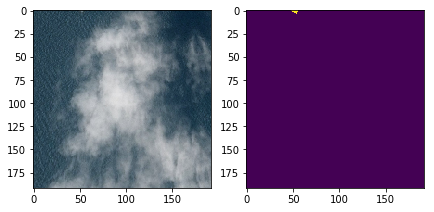

22 [0 1]


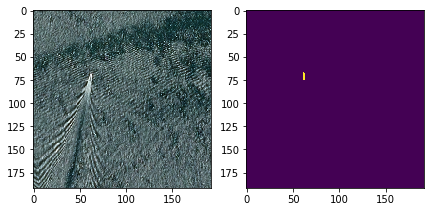

0 [0]


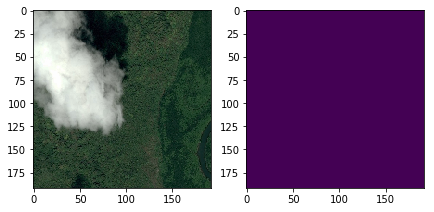

181 [0 1]


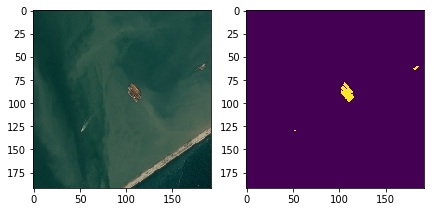

17 [0 1]


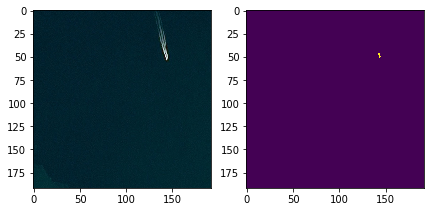

54 [0 1]


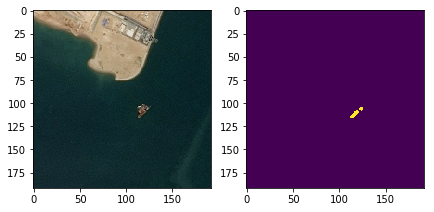

28 [0 1]


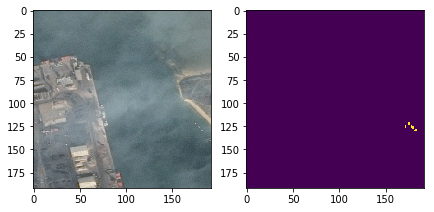

7 [0 1]


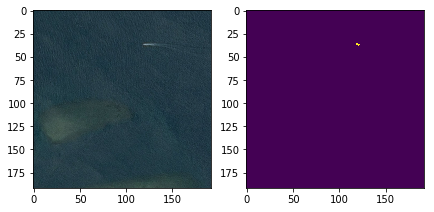

121 [0 1]


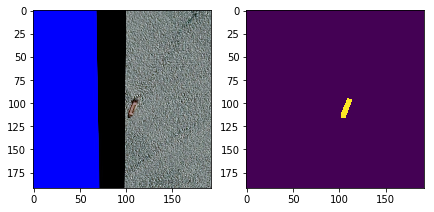

2 [0 1]


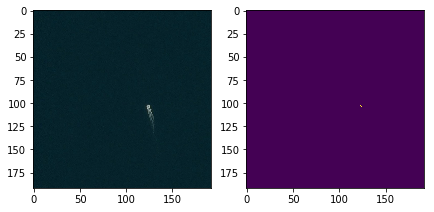

111 [0 1]


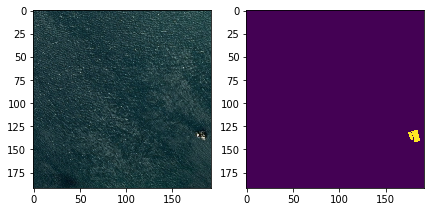

81 [0 1]


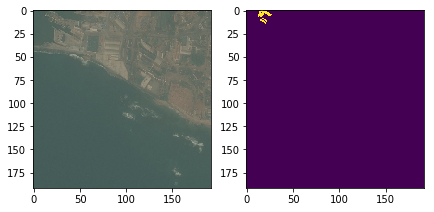

15 [0 1]


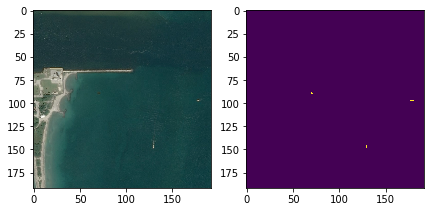

4 [0 1]


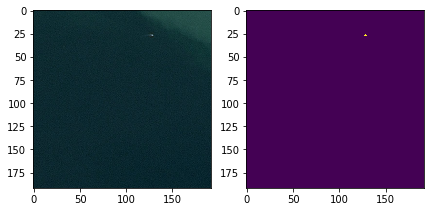

15 [0 1]


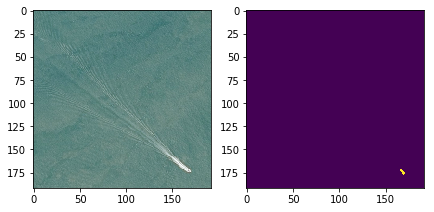

10 [0 1]


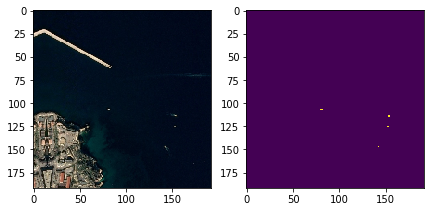

5 [0 1]


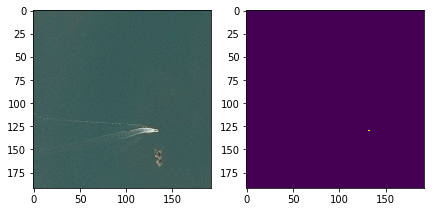

9 [0 1]


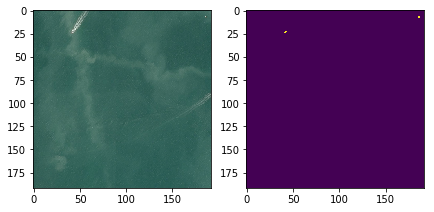

147 [0 1]


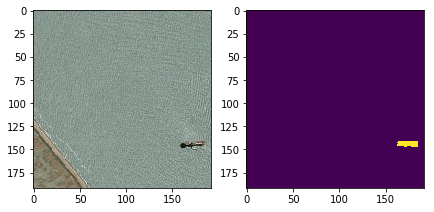

46 [0 1]


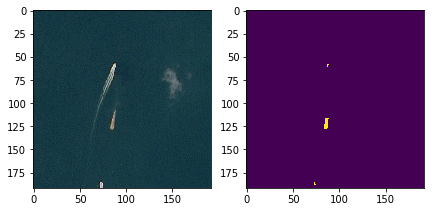

48 [0 1]


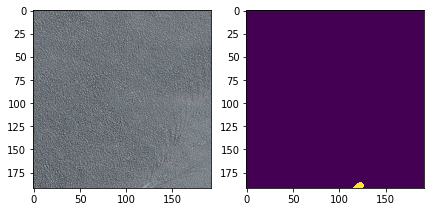

20 [0 1]


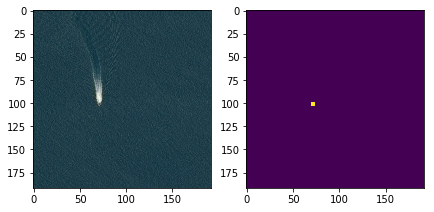

141 [0 1]


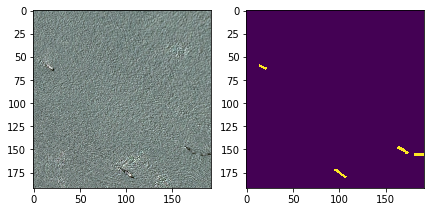

15 [0 1]


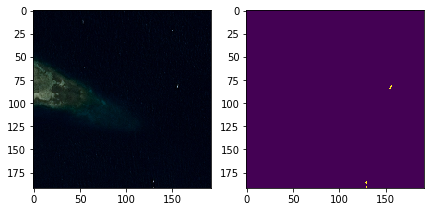

In [83]:
for xi, yi in zip(x_np, y_np):
    xi = np.rollaxis(xi, 0, 3)
    fig, axes = plt.subplots(1,2,figsize=(7,7))
    print(np.sum(yi), np.unique(yi))
    axes[0].imshow(xi)
    axes[1].imshow(yi)
    plt.show()

### Loss

In [48]:
class FocalLoss(nn.Module):
    def __init__(self, gamma):
        super().__init__()
        self.gamma = gamma
        
    def forward(self, logits, target):
        target = target.float()
        if not (target.size() == logits.size()):
            raise ValueError("Target size ({}) must be the same as input size ({})"
                             .format(target.size(), logits.size()))

        max_val = (-logits).clamp(min=0)
        loss = logits - logits * target + max_val + \
            ((-max_val).exp() + (-logits - max_val).exp()).log()

        invprobs = F.logsigmoid(-logits * (target * 2.0 - 1.0))
        loss = (invprobs * self.gamma).exp() * loss
        
        return loss.mean()
    
def dice_loss(logits, target):
    target = target.float()
    logits = torch.sigmoid(logits)
    smooth = 1.0

    iflat = logits.view(-1)
    tflat = target.view(-1)
    intersection = (iflat * tflat).sum()
    
    return ((2.0 * intersection + smooth) / (iflat.sum() + tflat.sum() + smooth))


class MixedLoss(nn.Module):
    def __init__(self, alpha, gamma):
        super().__init__()
        self.alpha = alpha
        self.focal = FocalLoss(gamma)
        
    def forward(self, input, target):
        target = target.float()
        loss = self.alpha*self.focal(input, target) - torch.log(dice_loss(input, target))
        return loss.mean()


def loss1(input, target): 
    target = target.float()
    return FocalLoss(2)(input, target)   
    
def loss2(input, target): 
    target = target.float()
    return (- torch.log(dice_loss(input, target)))

In [49]:
data.c = 1

In [50]:
learn = Learner.create_unet(data, models.resnet18, 
                            loss_func=MixedLoss(10, 2),
                            metrics=[dice_loss, loss1, loss2])

In [51]:
learn.freeze_to(2)

In [ ]:
learn.fit_one_cycle(cyc_len=20, max_lr=2e-1)

epoch,train_loss,valid_loss,dice_loss,loss1,loss2


In [30]:
x,y = next(iter(learn.data.valid_dl))

In [31]:
model = learn.model.eval()

In [32]:
out = model(x)

In [33]:
out_np = to_np(out.squeeze(1))

In [38]:
y_np = to_np(y.squeeze(1))

In [34]:
x_np = to_np(x)

In [35]:
x_np.shape, out_np.shape

((64, 3, 192, 192), (64, 192, 192))

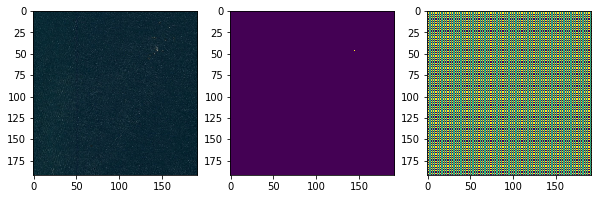

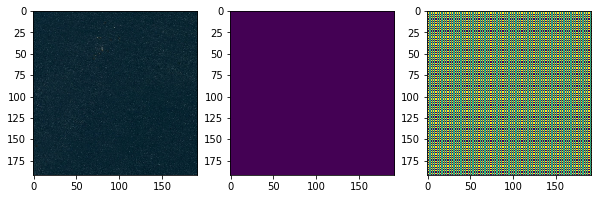

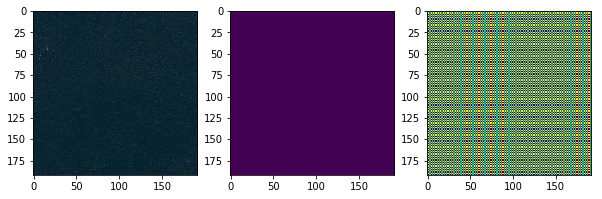

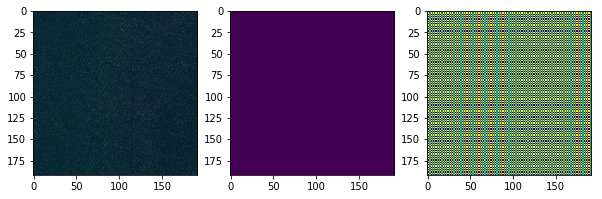

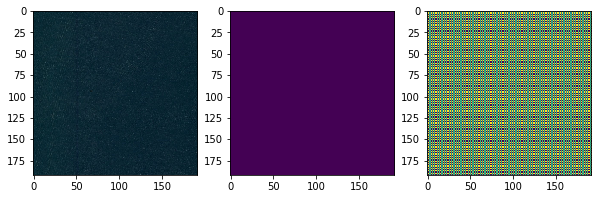

...

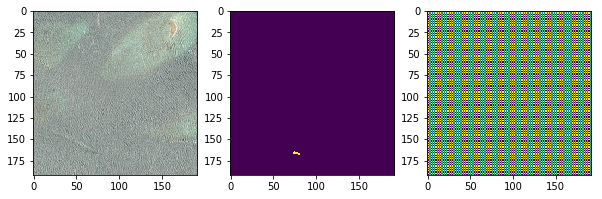

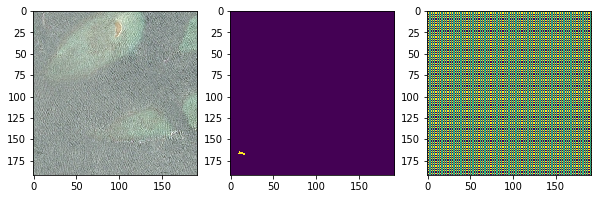

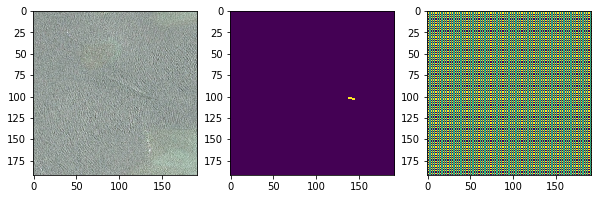

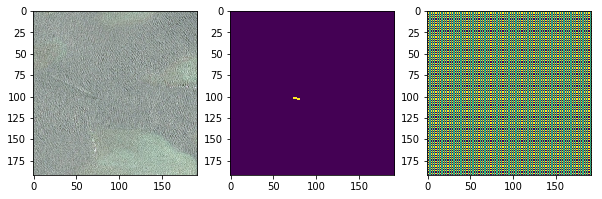

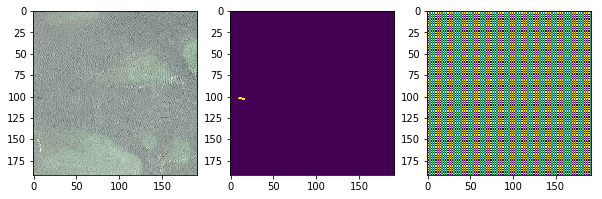

In [41]:
for xi, yi, outi in zip(x_np, y_np, out_np):
    fig, axes = plt.subplots(1,3,figsize=(10,10))
    axes[0].imshow(np.rollaxis(xi, 0, 3))
    axes[1].imshow(yi)
    axes[2].imshow(outi)
    plt.show()